<a href="https://colab.research.google.com/github/AK2299/Show-boxx/blob/main/accident_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
'''
Analyze traffic accident data to identify patterns related to road conditions, weather, and time of day. Visualize accident hotspots and contributing factors.
'''
import pandas as pd
import numpy as numpy
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px





In [2]:
df_IND=pd.read_csv('/content/df.csv')
df_IND.head()

,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
0,Agra,Traffic Control,Flashing Signal/Blinker,Greviously Injured,0.0
1,Agra,Traffic Control,Flashing Signal/Blinker,Minor Injury,0.0
2,Agra,Traffic Control,Flashing Signal/Blinker,Persons Killed,0.0
3,Agra,Traffic Control,Flashing Signal/Blinker,Total Injured,0.0
4,Agra,Traffic Control,Flashing Signal/Blinker,Total number of Accidents,0.0


In [3]:
#BASIC EDA(EXLPORATORY DATA ANALYSIS)

df_IND.columns

Index(['Million Plus Cities', 'Cause category', 'Cause Subcategory',
       'Outcome of Incident', 'Count'],
      dtype='object')

In [4]:
df_IND.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9550 entries, 0 to 9549
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Million Plus Cities  9550 non-null   object 
 1   Cause category       9550 non-null   object 
 2   Cause Subcategory    9550 non-null   object 
 3   Outcome of Incident  9550 non-null   object 
 4   Count                9547 non-null   float64
dtypes: float64(1), object(4)
memory usage: 373.2+ KB


In [5]:
df_IND.describe()

,Count
count,9547.000000
mean,103.627632
std,275.189303
min,0.000000
25%,0.000000
50%,12.000000
75%,70.500000
max,3148.000000


In [6]:
df_IND.isnull().sum()

,0
Million Plus Cities,0
Cause category,0
Cause Subcategory,0
Outcome of Incident,0
Count,3


In [7]:
#finding null values
df_IND[df_IND['Count'].isnull()]


,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
7056,Gwalior,Impacting Vehicle/Object,Other Non,Greviously Injured,NaN
7057,Gwalior,Impacting Vehicle/Object,Other Non,Persons Killed,NaN
7058,Gwalior,Impacting Vehicle/Object,Other Non,Minor Injury,NaN


In [8]:
df_IND.dtypes

,0
Million Plus Cities,object
Cause category,object
Cause Subcategory,object
Outcome of Incident,object
Count,float64


In [9]:
df_IND.shape

(9550, 5)

In [10]:
#segregate colomns as per categories
category_columns=df_IND.select_dtypes(include=['object']).columns

category_columns

Index(['Million Plus Cities', 'Cause category', 'Cause Subcategory',
       'Outcome of Incident'],
      dtype='object')

In [11]:
#segregate columns as per neumerical values
neumeric_columns=df_IND.select_dtypes(include=['int64','float64']).columns

neumeric_columns
dtypes=(neumeric_columns,category_columns)

dtypes

(Index(['Count'], dtype='object'),
 Index(['Million Plus Cities', 'Cause category', 'Cause Subcategory',
        'Outcome of Incident'],
       dtype='object'))

In [12]:
#number of unique values and percentage of unique values in categorial columns

for i in category_columns:
    print(f'{i}: {df_IND[i].nunique()}')
    print(df_IND[i].value_counts()/len(df_IND[i])*100)
    print('')

Million Plus Cities: 50
Million Plus Cities
Agra                    2.0
Patna                   2.0
Kollam                  2.0
Kota                    2.0
Lucknow                 2.0
Ludhiana                2.0
Madurai                 2.0
Mallapuram              2.0
Meerut                  2.0
Mumbai                  2.0
Nagpur                  2.0
Nashik                  2.0
Pune                    2.0
Ahmedabad               2.0
Raipur                  2.0
Rajkot                  2.0
Srinagar                2.0
Surat                   2.0
Thiruvanthapuram        2.0
Thrissur                2.0
Tiruchirapalli          2.0
Vadodra                 2.0
Varanasi                2.0
Vijaywada city          2.0
Kolkata                 2.0
Kochi                   2.0
Khozikode               2.0
Kanpur                  2.0
Allahabad(Prayagraj)    2.0
Amritsar                2.0
Asansol Durgapur        2.0
Aurangabad              2.0
Bengaluru               2.0
Bhopal                  2.0
Chan

In [13]:
#missing values

df_IND[(df_IND['Million Plus Cities']=='Gwalior') & (df_IND['Cause category']=='Impacting Vehicle/Object') &
(df_IND['Cause Subcategory']=='Other Non')]

,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
7056,Gwalior,Impacting Vehicle/Object,Other Non,Greviously Injured,NaN
7057,Gwalior,Impacting Vehicle/Object,Other Non,Persons Killed,NaN
7058,Gwalior,Impacting Vehicle/Object,Other Non,Minor Injury,NaN
7059,Gwalior,Impacting Vehicle/Object,Other Non,Total number of Accidents,0.0


In [14]:
#in same millon plus cities ,category and sub category we can count the value 0
#so we assume null values as 0

df_IND.fillna(0,inplace=True)
df_IND[(df_IND['Million Plus Cities']=='Gwalior') & (df_IND['Cause category']=='Impacting Vehicle/Object') &
(df_IND['Cause Subcategory']=='Other Non')]

,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
7056,Gwalior,Impacting Vehicle/Object,Other Non,Greviously Injured,0.0
7057,Gwalior,Impacting Vehicle/Object,Other Non,Persons Killed,0.0
7058,Gwalior,Impacting Vehicle/Object,Other Non,Minor Injury,0.0
7059,Gwalior,Impacting Vehicle/Object,Other Non,Total number of Accidents,0.0


<ipython-input-15-8bafca2b3d4b>:8: UserWarning: The palette list has more values (50) than needed (1), which may not be intended.
  sns.countplot(data=df_IND,x=columns,palette=palette,hue=Any)


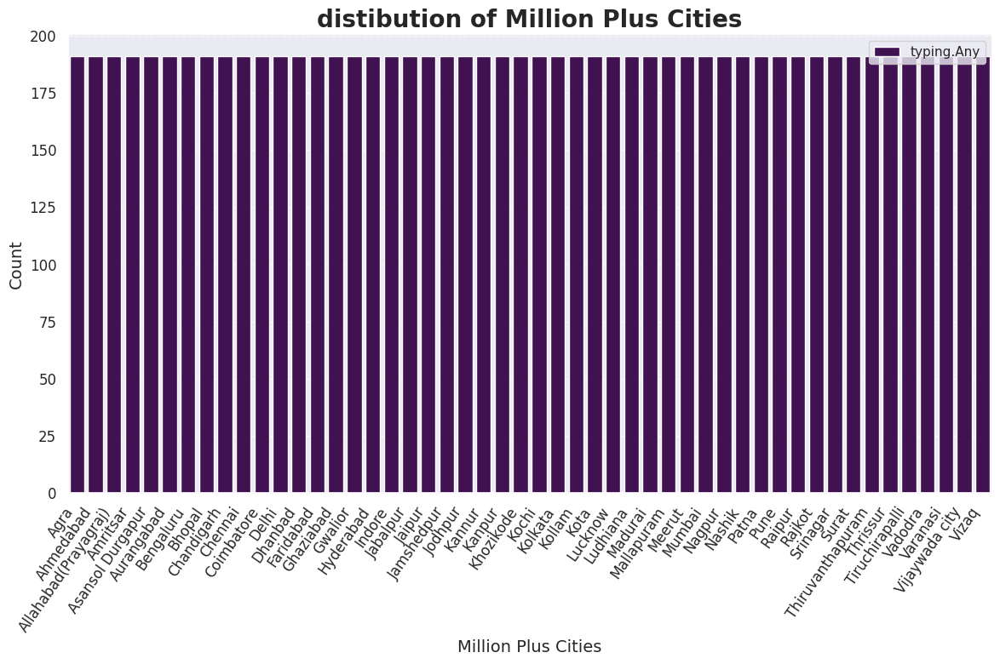

<ipython-input-15-8bafca2b3d4b>:8: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.countplot(data=df_IND,x=columns,palette=palette,hue=Any)


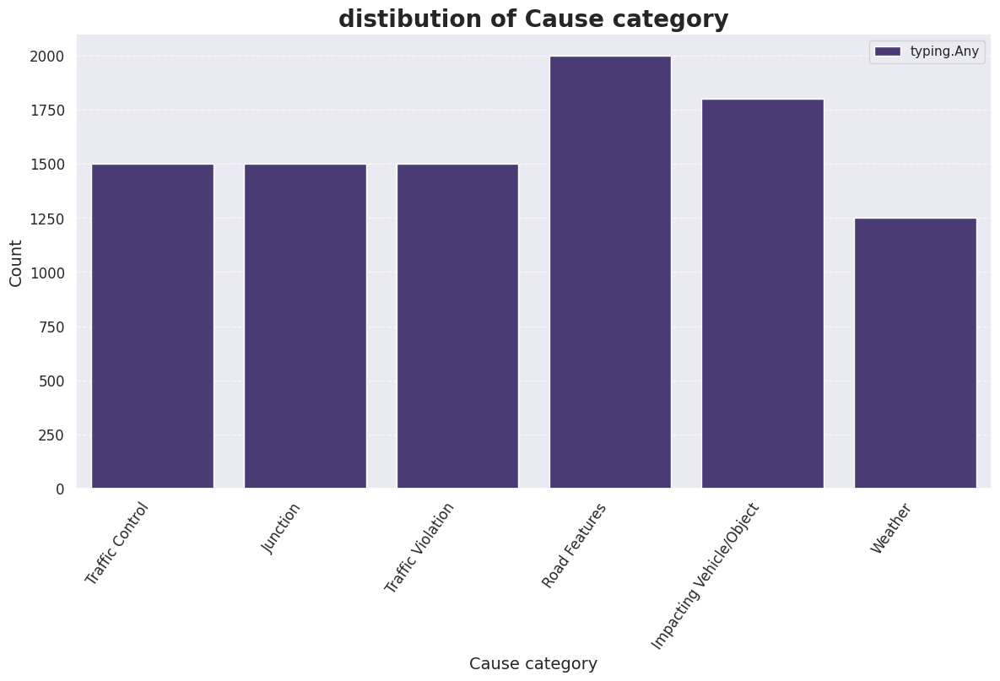

<ipython-input-15-8bafca2b3d4b>:8: UserWarning: The palette list has more values (35) than needed (1), which may not be intended.
  sns.countplot(data=df_IND,x=columns,palette=palette,hue=Any)


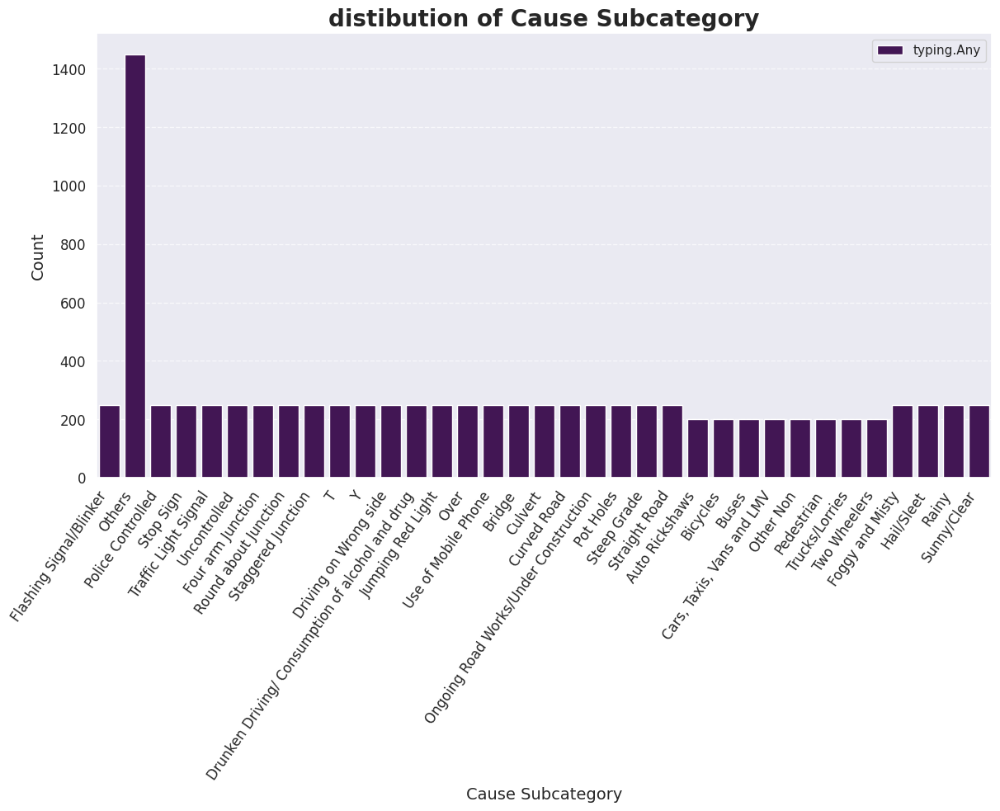

<ipython-input-15-8bafca2b3d4b>:8: UserWarning: The palette list has more values (5) than needed (1), which may not be intended.
  sns.countplot(data=df_IND,x=columns,palette=palette,hue=Any)


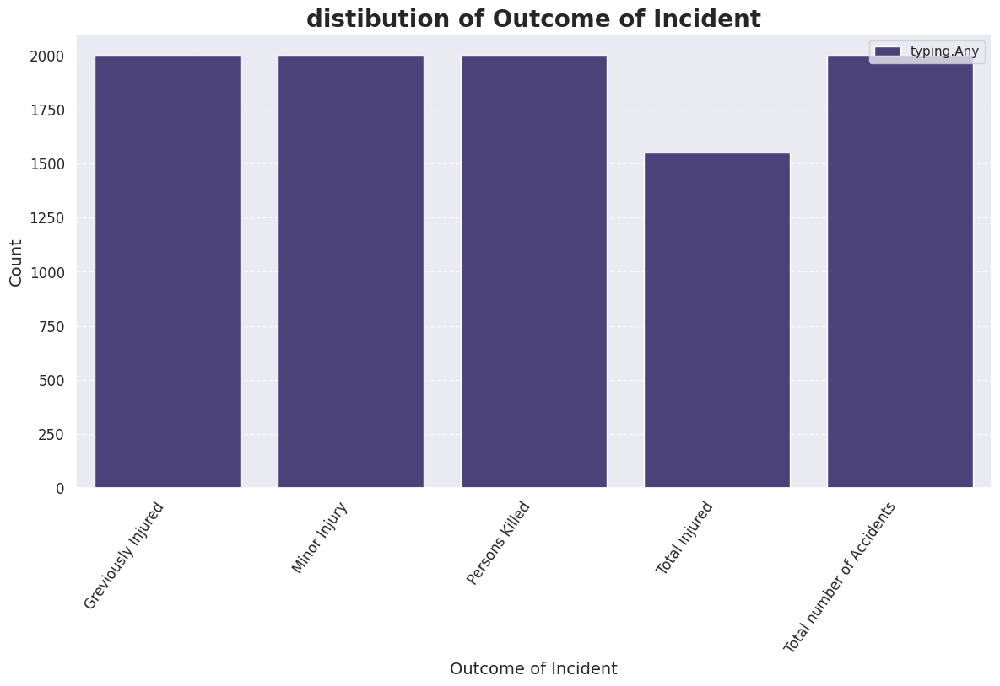

In [15]:
#Data Analysis and Visualization
from typing import Any
sns.set_theme(style="darkgrid")
for columns in category_columns:
  unique_values=df_IND[columns].nunique()
  palette=sns.color_palette("viridis",n_colors=unique_values)
  plt.figure(figsize=(14,7))
  sns.countplot(data=df_IND,x=columns,palette=palette,hue=Any)
  plt.title(f'distibution of {columns}',fontsize=20,weight='bold')
  plt.xlabel(columns, fontsize=14)
  plt.ylabel("Count", fontsize=14)
  plt.xticks(rotation=55,ha='right',fontsize=12)
  plt.yticks(fontsize=12)
  plt.grid(axis='y', linestyle='--', alpha=0.7)
  plt.show()



In [16]:
#Analysis: Total number of Accidents¶
total_accidents_df = df_IND[df_IND['Outcome of Incident']=='Total number of Accidents']
total_accidents_df

,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
4,Agra,Traffic Control,Flashing Signal/Blinker,Total number of Accidents,0.0
9,Agra,Traffic Control,Others,Total number of Accidents,470.0
14,Agra,Traffic Control,Police Controlled,Total number of Accidents,0.0
19,Agra,Traffic Control,Stop Sign,Total number of Accidents,0.0
24,Agra,Traffic Control,Traffic Light Signal,Total number of Accidents,66.0
...,...,...,...,...,...
9528,Vizaq,Weather,Foggy and Misty,Total number of Accidents,71.0
9533,Vizaq,Weather,Hail/Sleet,Total number of Accidents,9.0
9538,Vizaq,Weather,Others,Total number of Accidents,453.0
9543,Vizaq,Weather,Rainy,Total number of Accidents,25.0


In [17]:
#Distribution of total number of Accidents across cities
accident_cities = total_accidents_df.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)

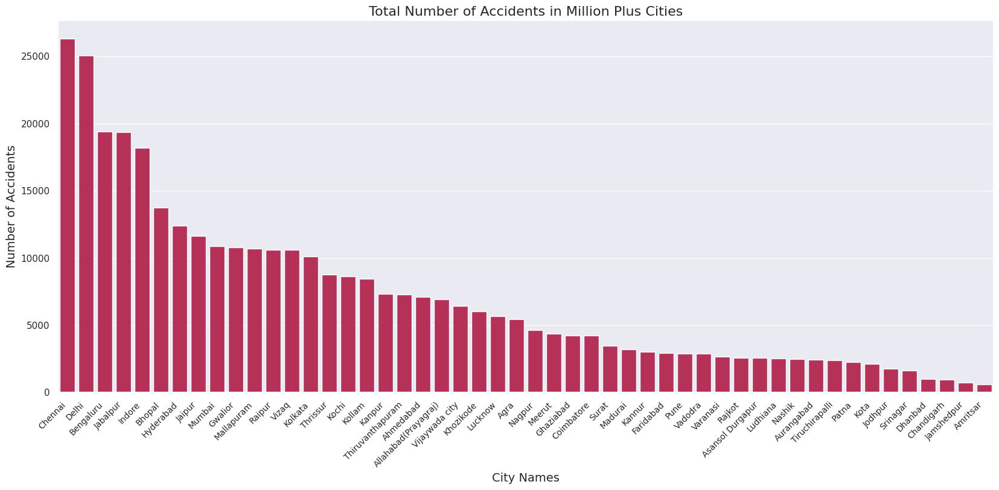

In [18]:
plt.figure(figsize=(20,8))
sns.barplot(x=accident_cities.index, y=accident_cities.values, palette='rocket',hue=Any,legend=False)

plt.title("Total Number of Accidents in Million Plus Cities", fontsize=16)
plt.xlabel("City Names", fontsize=14,)
plt.ylabel("Number of Accidents", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.show()

In [19]:
#Study w.r.t. Cause Category and Subcategory
accident_labels = total_accidents_df['Cause category'].unique()
accident_labels

array(['Traffic Control', 'Junction', 'Traffic Violation',
       'Road Features', 'Impacting Vehicle/Object', 'Weather'],
      dtype=object)

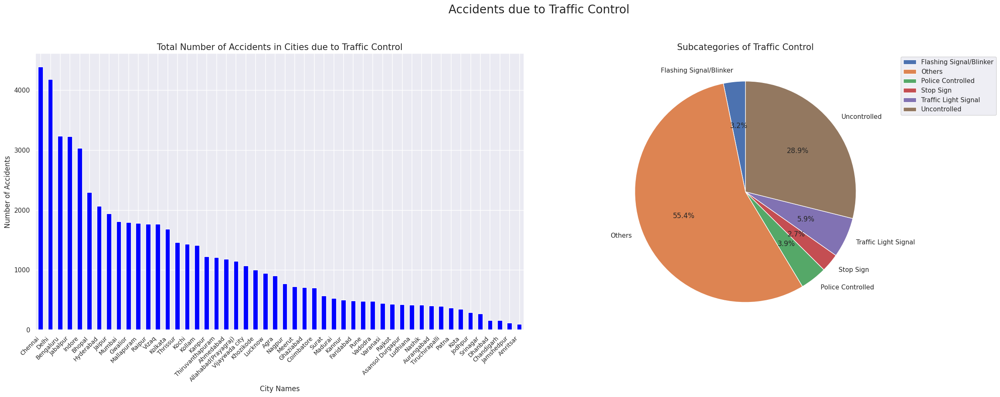

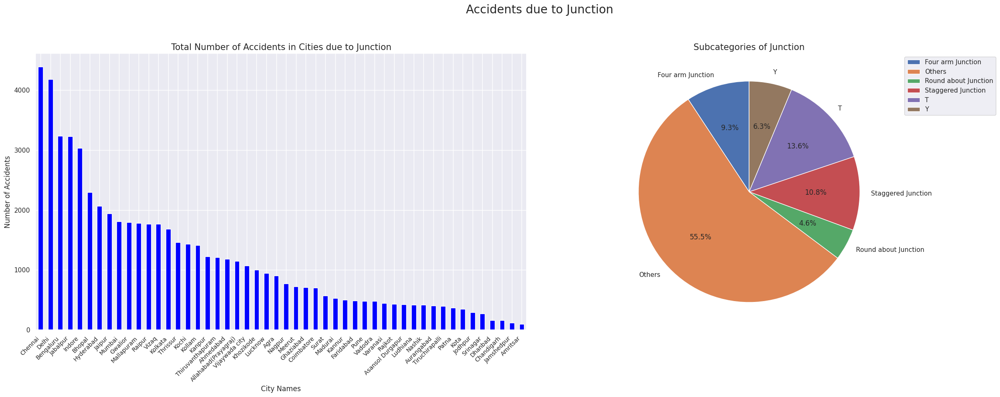

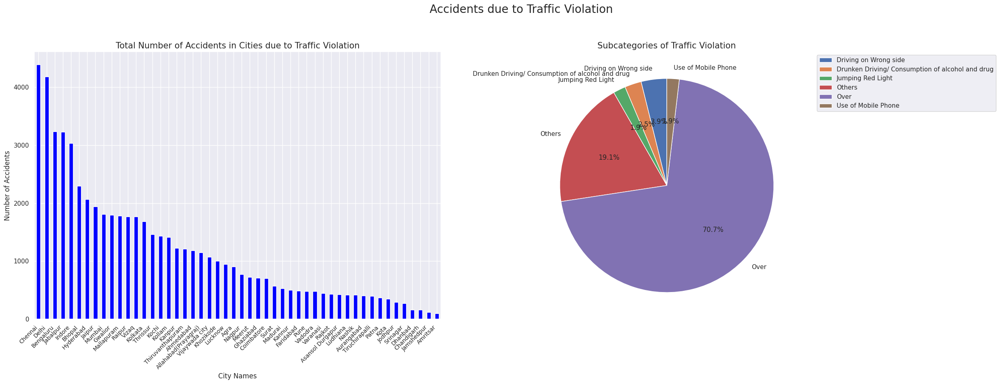

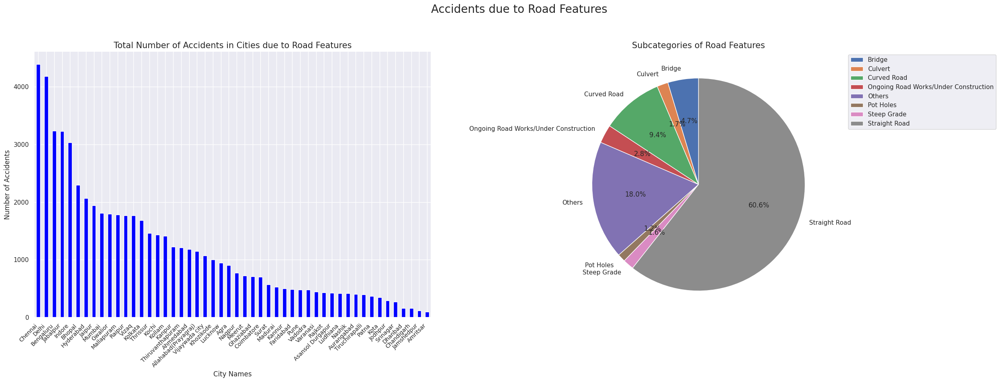

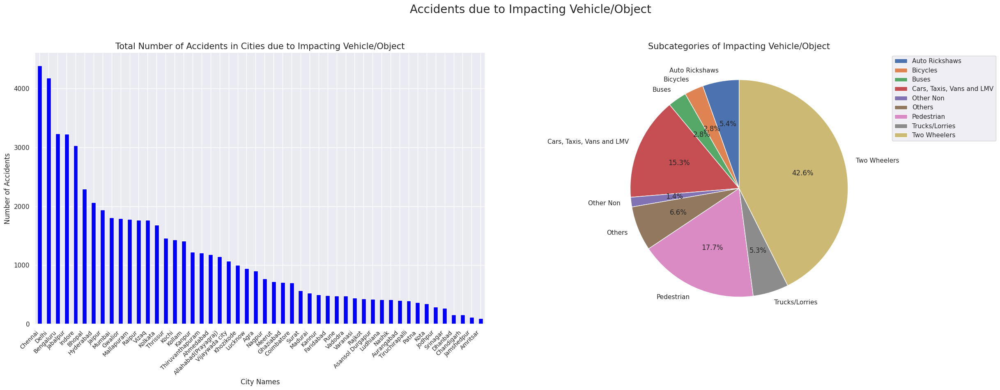

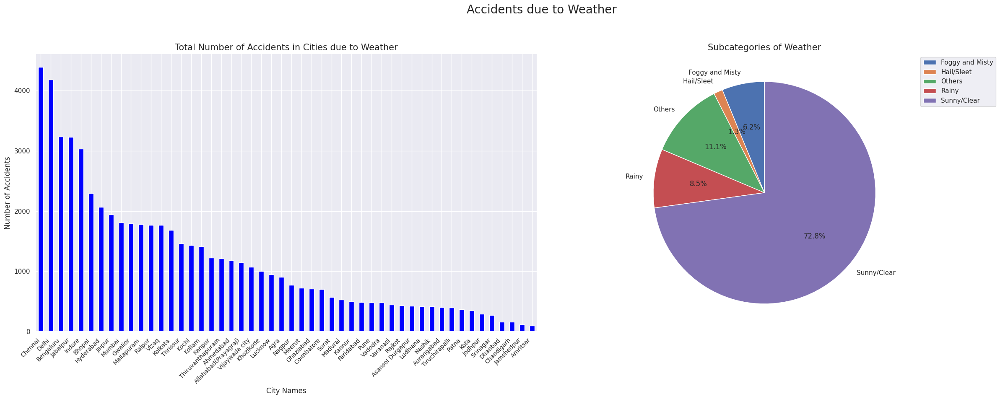

In [20]:
for label in accident_labels:
    #Specific cause category of accident
    label_cat = total_accidents_df[total_accidents_df['Cause category']==label]

    #Grouping data by city for bar plot
    accidents_cat = label_cat.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)

    #Grouping data by sub-categories for pie chart
    labels_subcat = label_cat.groupby('Cause Subcategory')['Count'].sum()

    fig, axes = plt.subplots(1, 2, figsize=(26, 10))
    fig.suptitle(f"Accidents due to {label}", fontsize=20)

    #Barplot
    accidents_cat.plot(kind='bar', ax=axes[0], color='blue')
    axes[0].set_title(f"Total Number of Accidents in Cities due to {label}", fontsize=15)
    axes[0].set_xlabel("City Names")
    axes[0].set_ylabel("Number of Accidents")
    axes[0].tick_params(axis='x', rotation=45, labelsize=10)
    for tick in axes[0].get_xticklabels():
        tick.set_horizontalalignment('right')

    #Pie chart for subcategory
    labels_subcat.plot(kind='pie', ax=axes[1], autopct='%1.1f%%', startangle=90, legend=False)
    axes[1].set_title(f"Subcategories of {label}", fontsize=15)
    axes[1].set_ylabel("")

    axes[1].legend(bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for the suptitle
    plt.show()

In [21]:
#Data Frame of cause sub-categories with top 4 cities
data = []
labels_subcat = total_accidents_df['Cause Subcategory'].unique()

for label in labels_subcat:
    labels_subcat_df = total_accidents_df[total_accidents_df['Cause Subcategory']==label]

    #top 4 cities
    top_4_cities = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().nlargest(4).index.tolist()

    data.append({
        'Cause Subcategory': label,
        'Top 4 Cities': ",".join(top_4_cities)
    })

accidents_cause_city_df = pd.DataFrame(data)
accidents_cause_city_df

,Cause Subcategory,Top 4 Cities
0,Flashing Signal/Blinker,"Chennai,Delhi,Allahabad(Prayagraj),Kollam"
1,Others,"Delhi,Jabalpur,Chennai,Bengaluru"
2,Police Controlled,"Chennai,Kochi,Bengaluru,Kollam"
3,Stop Sign,"Bhopal,Chennai,Delhi,Allahabad(Prayagraj)"
4,Traffic Light Signal,"Chennai,Delhi,Bengaluru,Vizaq"
5,Uncontrolled,"Mumbai,Hyderabad,Jabalpur,Indore"
6,Four arm Junction,"Indore,Chennai,Bengaluru,Delhi"
7,Round about Junction,"Chennai,Hyderabad,Indore,Delhi"
8,Staggered Junction,"Mumbai,Hyderabad,Chennai,Bhopal"
9,T,"Jabalpur,Indore,Delhi,Kollam"


In [22]:
accident_labels = total_accidents_df['Cause category'].unique()
accident_labels

array(['Traffic Control', 'Junction', 'Traffic Violation',
       'Road Features', 'Impacting Vehicle/Object', 'Weather'],
      dtype=object)

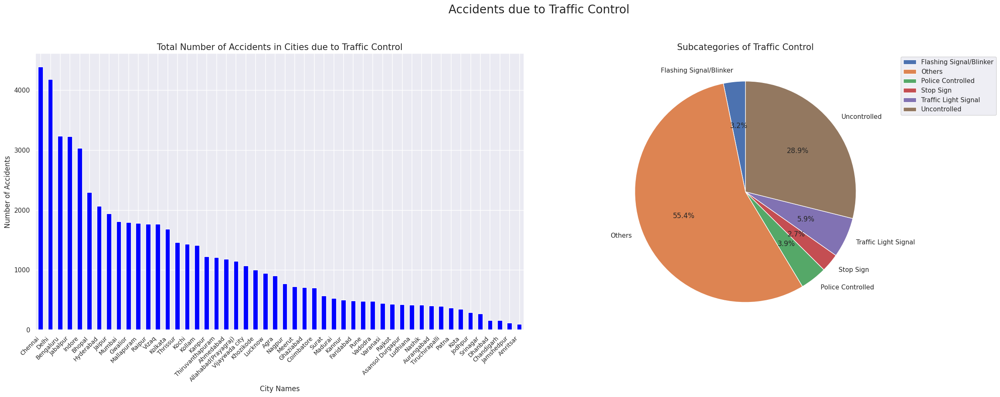

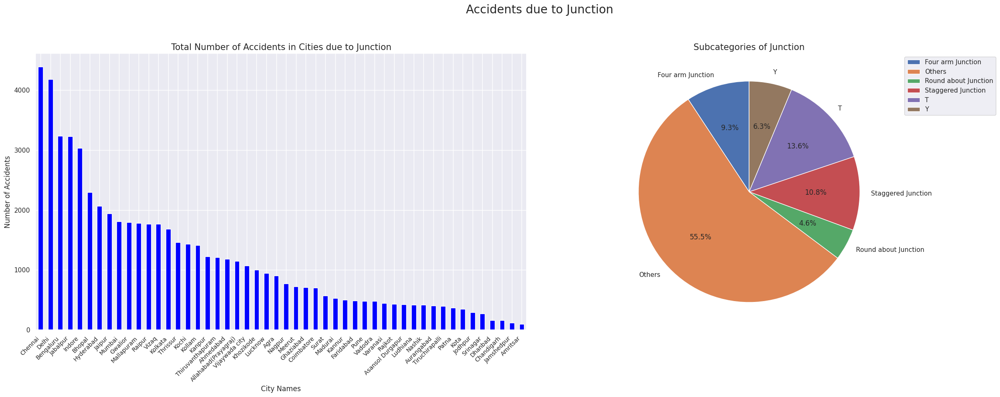

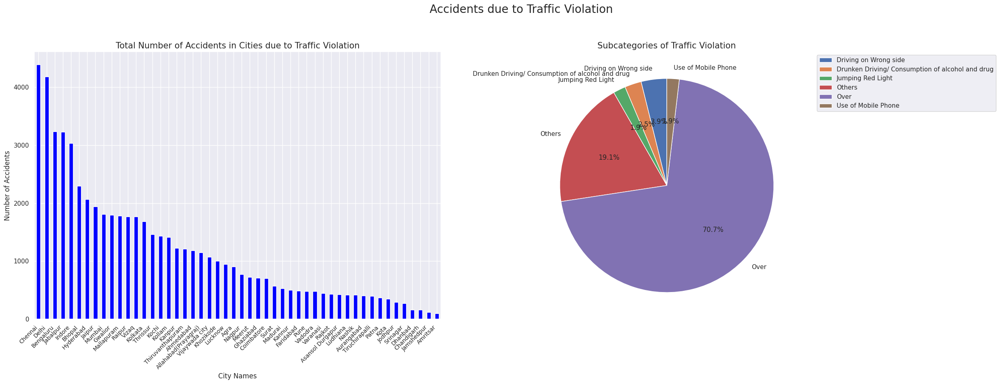

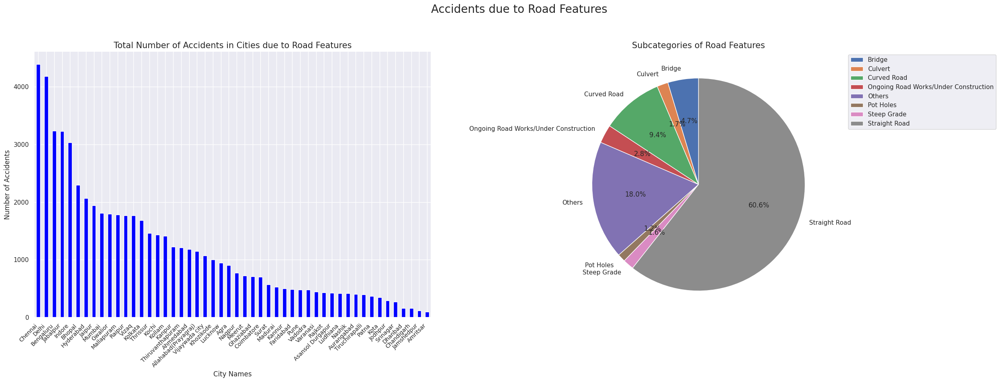

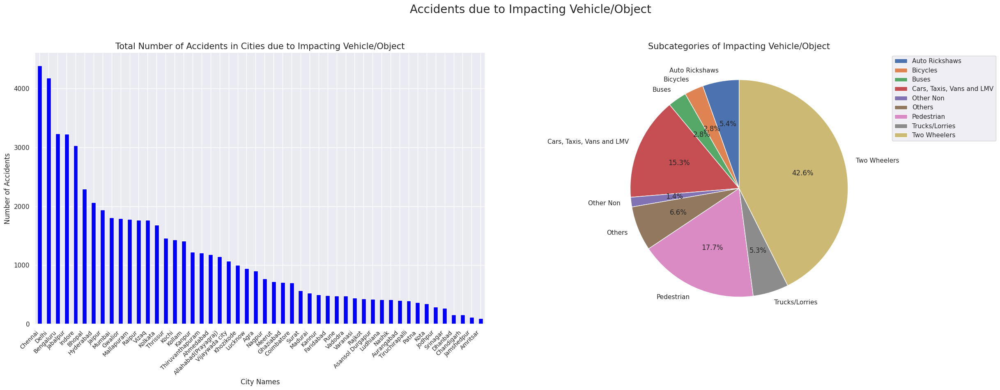

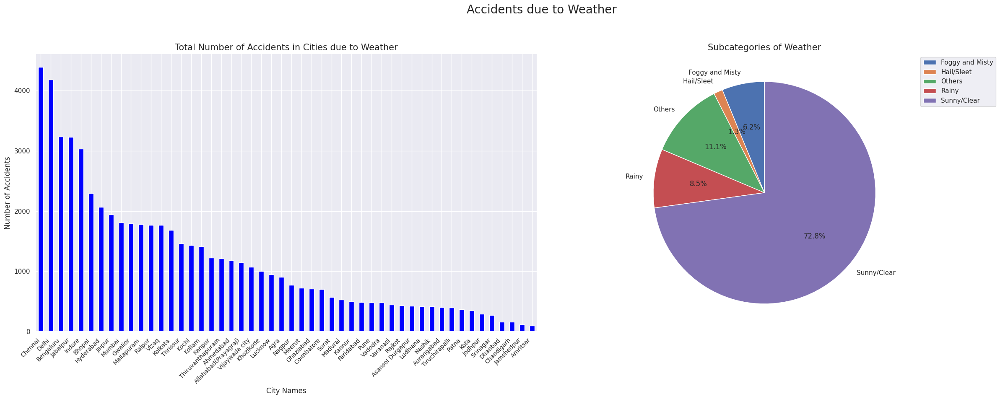

In [23]:
for label in accident_labels:
    #Specific cause category of accident
    label_cat = total_accidents_df[total_accidents_df['Cause category']==label]

    #Grouping data by city for bar plot
    accidents_cat = label_cat.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)

    #Grouping data by sub-categories for pie chart
    labels_subcat = label_cat.groupby('Cause Subcategory')['Count'].sum()

    fig, axes = plt.subplots(1, 2, figsize=(26, 10))
    fig.suptitle(f"Accidents due to {label}", fontsize=20)

    #Barplot
    accidents_cat.plot(kind='bar', ax=axes[0], color='blue')
    axes[0].set_title(f"Total Number of Accidents in Cities due to {label}", fontsize=15)
    axes[0].set_xlabel("City Names")
    axes[0].set_ylabel("Number of Accidents")
    axes[0].tick_params(axis='x', rotation=45, labelsize=10)
    for tick in axes[0].get_xticklabels():
        tick.set_horizontalalignment('right')

    #Pie chart for subcategory
    labels_subcat.plot(kind='pie', ax=axes[1], autopct='%1.1f%%', startangle=90, legend=False)
    axes[1].set_title(f"Subcategories of {label}", fontsize=15)
    axes[1].set_ylabel("")

    axes[1].legend(bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for the suptitle
    plt.show()

In [24]:
data = []
labels_subcat = total_accidents_df['Cause Subcategory'].unique()

for label in labels_subcat:
    labels_subcat_df = total_accidents_df[total_accidents_df['Cause Subcategory']==label]

    #top 4 cities
    top_4_cities = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().nlargest(4).index.tolist()

    data.append({
        'Cause Subcategory': label,
        'Top 4 Cities': ",".join(top_4_cities)
    })

accidents_cause_city_df = pd.DataFrame(data)
accidents_cause_city_df

,Cause Subcategory,Top 4 Cities
0,Flashing Signal/Blinker,"Chennai,Delhi,Allahabad(Prayagraj),Kollam"
1,Others,"Delhi,Jabalpur,Chennai,Bengaluru"
2,Police Controlled,"Chennai,Kochi,Bengaluru,Kollam"
3,Stop Sign,"Bhopal,Chennai,Delhi,Allahabad(Prayagraj)"
4,Traffic Light Signal,"Chennai,Delhi,Bengaluru,Vizaq"
5,Uncontrolled,"Mumbai,Hyderabad,Jabalpur,Indore"
6,Four arm Junction,"Indore,Chennai,Bengaluru,Delhi"
7,Round about Junction,"Chennai,Hyderabad,Indore,Delhi"
8,Staggered Junction,"Mumbai,Hyderabad,Chennai,Bhopal"
9,T,"Jabalpur,Indore,Delhi,Kollam"


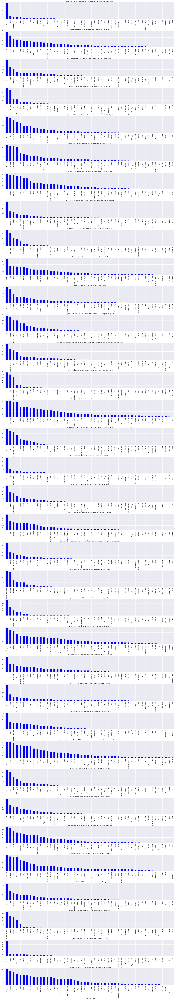

In [25]:
#Visualization of each Subcategory across different cities
num_subcategories = len(labels_subcat)
fig, axes = plt.subplots(num_subcategories, 1, figsize=(30, num_subcategories * 5))
fig.subplots_adjust(hspace=0.7)

for i, label in enumerate(labels_subcat):
    labels_subcat_df = total_accidents_df[total_accidents_df['Cause Subcategory']==label]
    subcat_accidents = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)
    subcat_accidents.plot(
        kind='bar',
        ax=axes[i] if num_subcategories > 1 else axes,
        color='blue'
    )
    axes[i].set_title(f"City-wise distribution of Total number of accidents due to {label}")

In [26]:
#Analysis: Total Injured
total_injured_df = df_IND[df_IND['Outcome of Incident']=='Total Injured']
total_injured_df

,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
3,Agra,Traffic Control,Flashing Signal/Blinker,Total Injured,0.0
8,Agra,Traffic Control,Others,Total Injured,266.0
13,Agra,Traffic Control,Police Controlled,Total Injured,0.0
18,Agra,Traffic Control,Stop Sign,Total Injured,0.0
23,Agra,Traffic Control,Traffic Light Signal,Total Injured,67.0
...,...,...,...,...,...
9529,Vizaq,Weather,Foggy and Misty,Total Injured,49.0
9534,Vizaq,Weather,Hail/Sleet,Total Injured,7.0
9539,Vizaq,Weather,Others,Total Injured,292.0
9544,Vizaq,Weather,Rainy,Total Injured,21.0


<ipython-input-27-4bfb94ab7a61>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=injured_cities.index, y=injured_cities.values, palette='rocket')


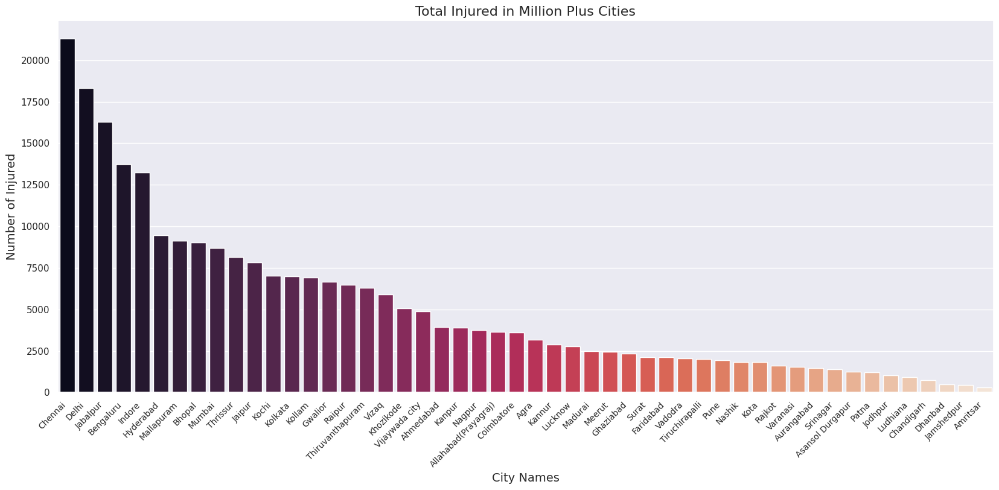

In [27]:
#Distribution of Total Injured across Cities
5+9
injured_cities = total_injured_df.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)
#Plotting Barplot
plt.figure(figsize=(20,8))
sns.barplot(x=injured_cities.index, y=injured_cities.values, palette='rocket')

plt.title("Total Injured in Million Plus Cities", fontsize=16)
plt.xlabel("City Names", fontsize=14)
plt.ylabel("Number of Injured", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.show()


In [28]:
#Study w.r.t. Cause Category and Cause Subcategory
injured_labels = total_injured_df['Cause category'].unique()
injured_labels

array(['Traffic Control', 'Junction', 'Traffic Violation',
       'Road Features', 'Weather'], dtype=object)

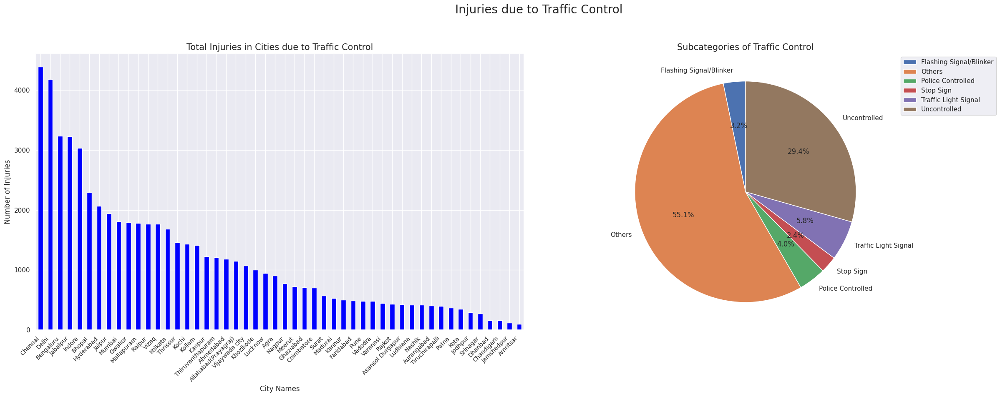

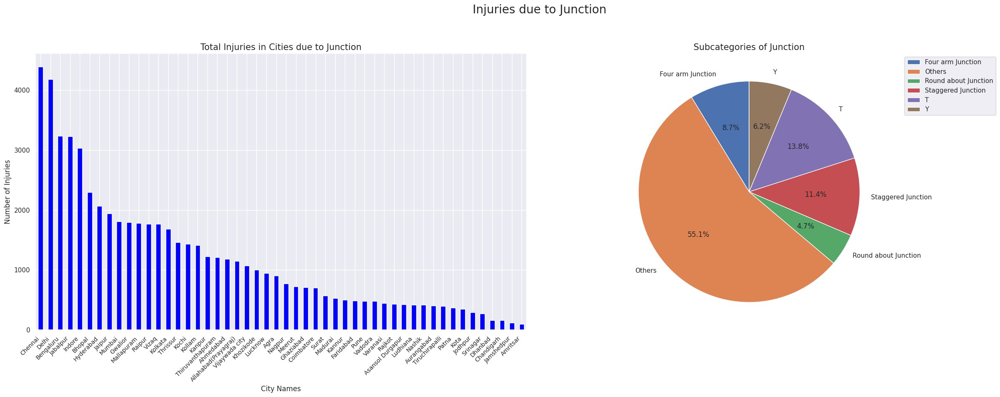

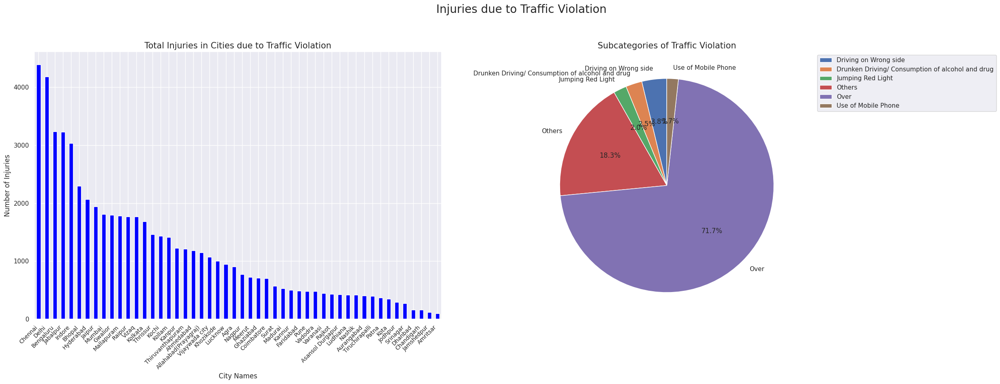

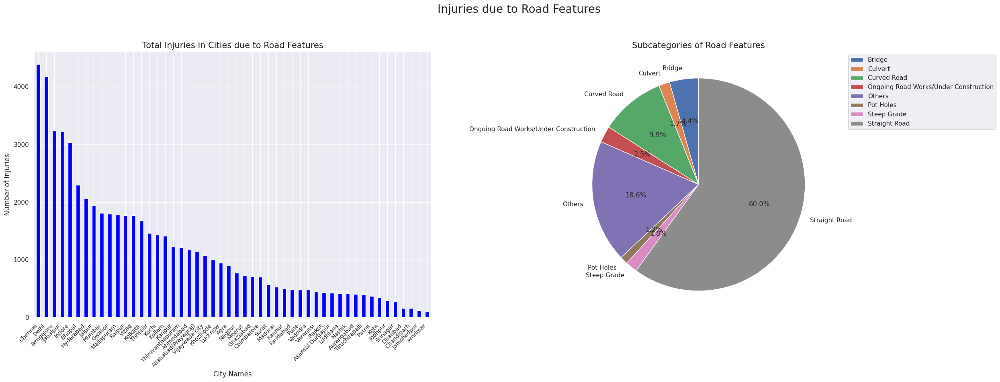

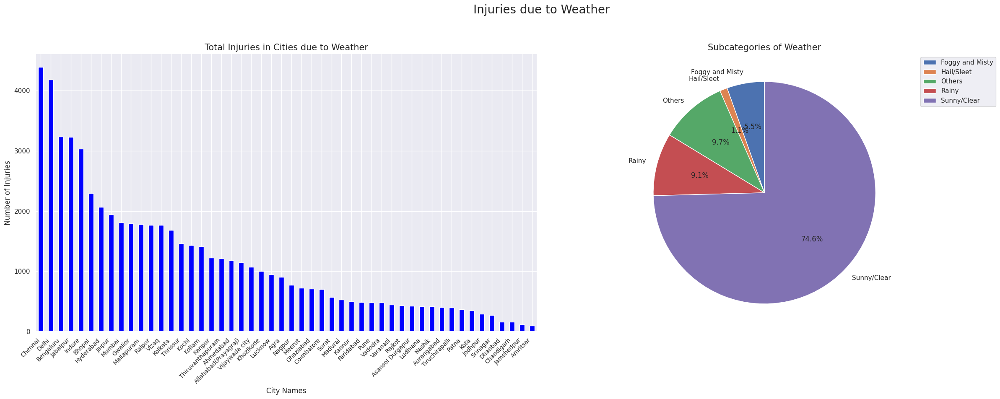

In [29]:
for label in injured_labels:
    label_cat = total_injured_df[total_injured_df['Cause category']==label]

    #Grouping data by city for bar plot
    injured_cat = label_cat.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)

    #Grouping data by sub-categories for pie chart
    labels_subcat = label_cat.groupby('Cause Subcategory')['Count'].sum()

    fig, axes = plt.subplots(1, 2, figsize=(26, 10))
    fig.suptitle(f"Injuries due to {label}", fontsize=20)

    #Barplot
    accidents_cat.plot(kind='bar', ax=axes[0], color='blue')
    axes[0].set_title(f"Total Injuries in Cities due to {label}", fontsize=15)
    axes[0].set_xlabel("City Names")
    axes[0].set_ylabel("Number of Injuries")
    axes[0].tick_params(axis='x', rotation=45, labelsize=10)
    for tick in axes[0].get_xticklabels():
        tick.set_horizontalalignment('right')

    #Pie chart for subcategory
    labels_subcat.plot(kind='pie', ax=axes[1], autopct='%1.1f%%', startangle=90, legend=False)
    axes[1].set_title(f"Subcategories of {label}", fontsize=15)
    axes[1].set_ylabel("")

    axes[1].legend(bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [30]:
#Data Frame of Cause Sub-Categories with top 4 Cities
data = []
labels_subcat = total_injured_df['Cause Subcategory'].unique()

for label in labels_subcat:
    labels_subcat_df = total_injured_df[total_injured_df['Cause Subcategory']==label]

    #top 4 cities
    top_4_cities = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().nlargest(4).index.tolist()

    data.append({
        'Cause Subcategory': label,
        'Top 4 Cities': ",".join(top_4_cities)
    })

injuries_cause_city_df = pd.DataFrame(data)
injuries_cause_city_df

,Cause Subcategory,Top 4 Cities
0,Flashing Signal/Blinker,"Chennai,Delhi,Kollam,Allahabad(Prayagraj)"
1,Others,"Delhi,Jabalpur,Chennai,Bengaluru"
2,Police Controlled,"Chennai,Kochi,Bengaluru,Kollam"
3,Stop Sign,"Bhopal,Chennai,Delhi,Allahabad(Prayagraj)"
4,Traffic Light Signal,"Chennai,Delhi,Bengaluru,Kolkata"
5,Uncontrolled,"Jabalpur,Mumbai,Hyderabad,Indore"
6,Four arm Junction,"Indore,Bengaluru,Chennai,Gwalior"
7,Round about Junction,"Chennai,Indore,Hyderabad,Delhi"
8,Staggered Junction,"Mumbai,Hyderabad,Chennai,Bhopal"
9,T,"Jabalpur,Kollam,Chennai,Indore"


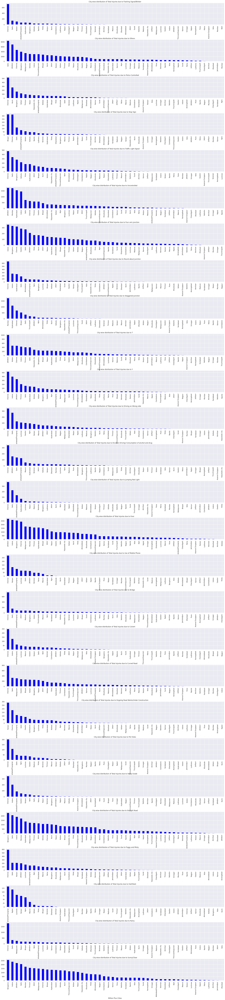

In [31]:
#Visualization of each Subcategory across different Cities
num_subcategories = len(labels_subcat)
fig, axes = plt.subplots(num_subcategories, 1, figsize=(30, num_subcategories * 5))
fig.subplots_adjust(hspace=0.7)

for i, label in enumerate(labels_subcat):
    labels_subcat_df = total_injured_df[total_injured_df['Cause Subcategory']==label]
    subcat_injured = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)
    subcat_injured.plot(
        kind='bar',
        ax=axes[i] if num_subcategories > 1 else axes,
        color='blue'
    )
    axes[i].set_title(f"City-wise distribution of Total Injuries due to {label}")

In [32]:
#Analysis: Persons Killed
total_killed_df = df_IND[df_IND['Outcome of Incident']=='Persons Killed']
total_killed_df

,Million Plus Cities,Cause category,Cause Subcategory,Outcome of Incident,Count
2,Agra,Traffic Control,Flashing Signal/Blinker,Persons Killed,0.0
7,Agra,Traffic Control,Others,Persons Killed,373.0
12,Agra,Traffic Control,Police Controlled,Persons Killed,0.0
17,Agra,Traffic Control,Stop Sign,Persons Killed,0.0
22,Agra,Traffic Control,Traffic Light Signal,Persons Killed,18.0
...,...,...,...,...,...
9527,Vizaq,Weather,Foggy and Misty,Persons Killed,7.0
9532,Vizaq,Weather,Hail/Sleet,Persons Killed,0.0
9537,Vizaq,Weather,Others,Persons Killed,68.0
9542,Vizaq,Weather,Rainy,Persons Killed,4.0


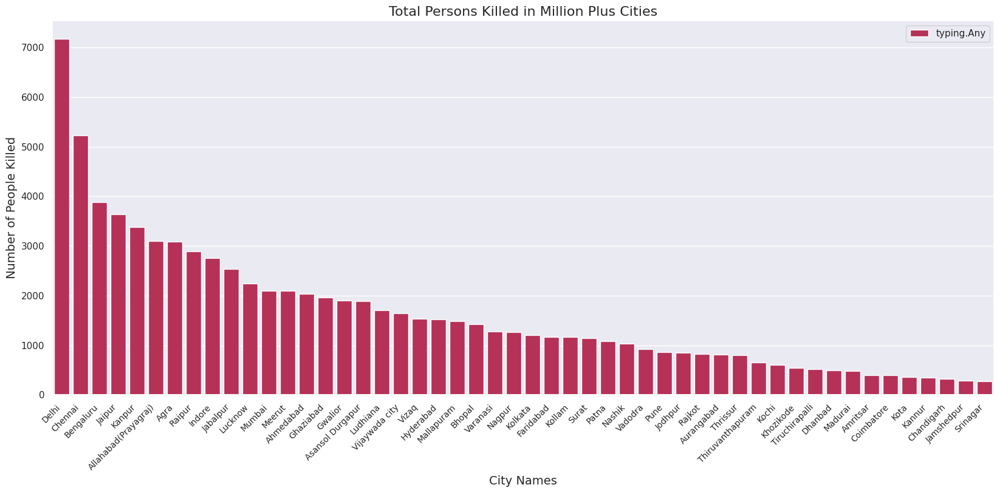

In [33]:
# Calculate total persons killed for each city and assign it to 'killed_cities'
killed_cities = total_killed_df.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)


#Plotting Barplot
plt.figure(figsize=(20,8))
sns.barplot(x=killed_cities.index, y=killed_cities.values, palette='rocket',hue=Any)

plt.title("Total Persons Killed in Million Plus Cities", fontsize=16)
plt.xlabel("City Names", fontsize=14)
plt.ylabel("Number of People Killed", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.show()

In [34]:
#Study w.r.t. Cause category and Subcategory
killed_labels = total_killed_df['Cause category'].unique()
killed_labels

array(['Traffic Control', 'Junction', 'Traffic Violation',
       'Road Features', 'Impacting Vehicle/Object', 'Weather'],
      dtype=object)

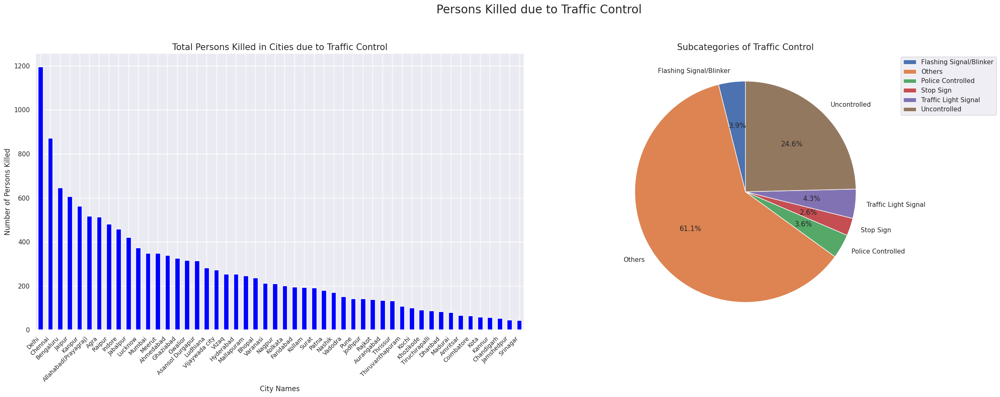

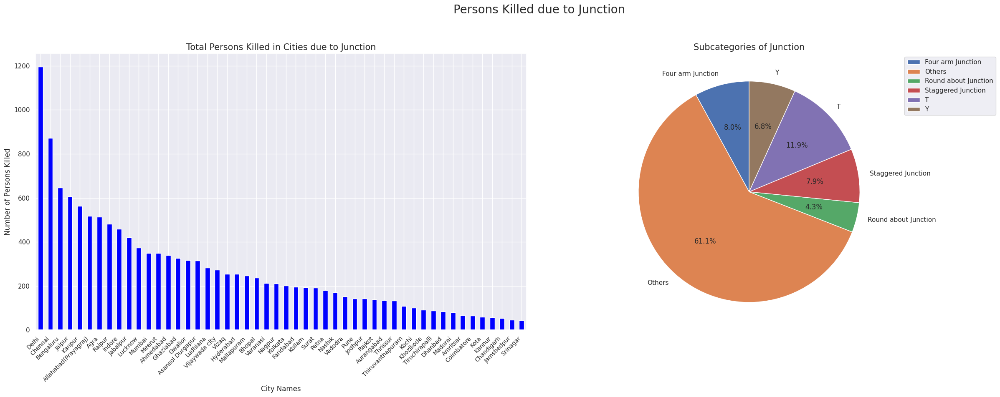

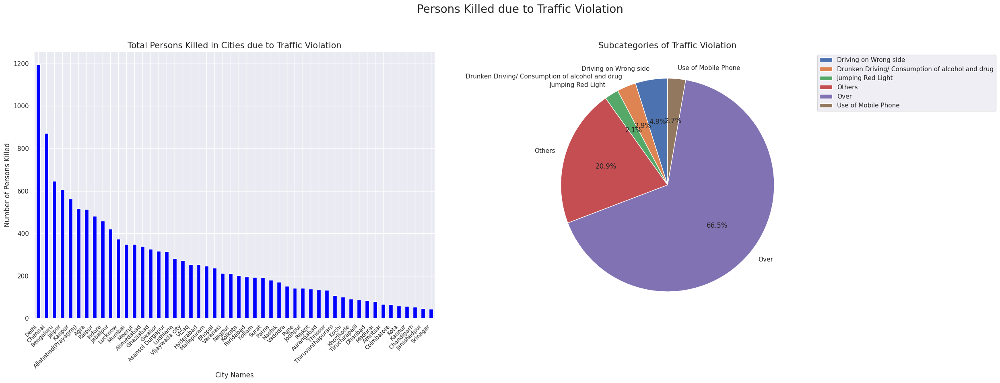

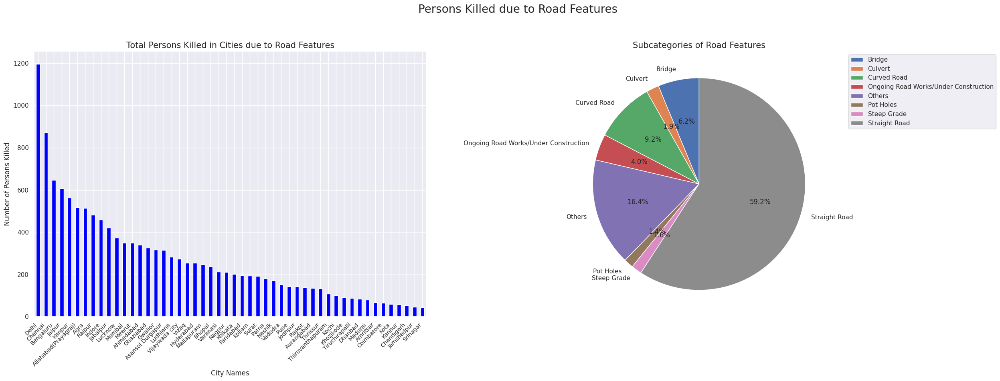

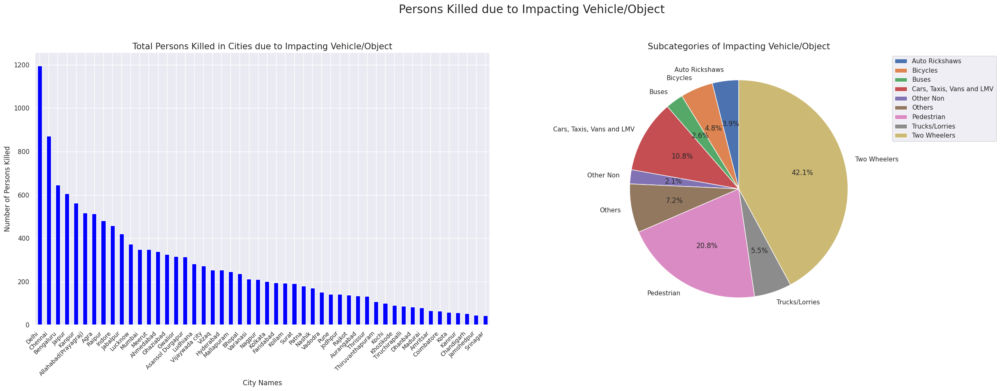

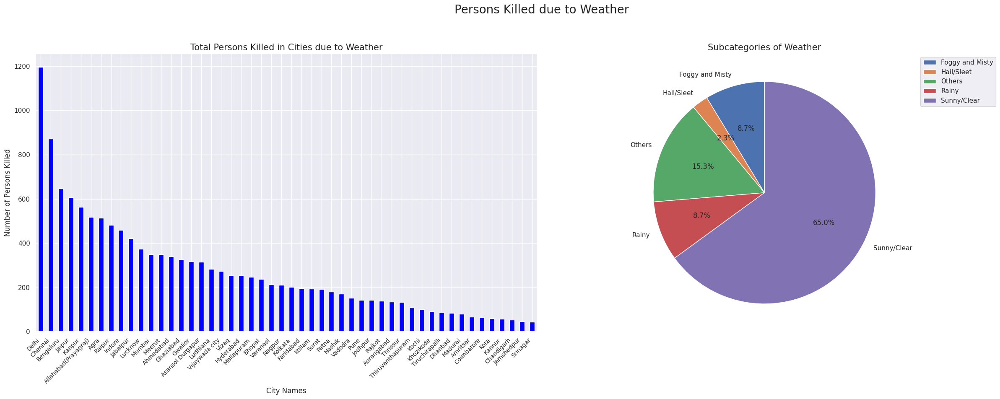

In [35]:
for label in killed_labels:
    label_cat = total_killed_df[total_killed_df['Cause category']==label]

    #Grouping data by city for bar plot
    killed_cat = label_cat.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)

    #Grouping data by sub-categories for pie chart
    labels_subcat = label_cat.groupby('Cause Subcategory')['Count'].sum()

    fig, axes = plt.subplots(1, 2, figsize=(26, 10))
    fig.suptitle(f"Persons Killed due to {label}", fontsize=20)

    #Barplot
    killed_cat.plot(kind='bar', ax=axes[0], color='blue')
    axes[0].set_title(f"Total Persons Killed in Cities due to {label}", fontsize=15)
    axes[0].set_xlabel("City Names")
    axes[0].set_ylabel("Number of Persons Killed")
    axes[0].tick_params(axis='x', rotation=45, labelsize=10)
    for tick in axes[0].get_xticklabels():
        tick.set_horizontalalignment('right')

    #Pie chart for subcategory
    labels_subcat.plot(kind='pie', ax=axes[1], autopct='%1.1f%%', startangle=90, legend=False)
    axes[1].set_title(f"Subcategories of {label}", fontsize=15)
    axes[1].set_ylabel("")

    axes[1].legend(bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [36]:
#Data frame of Cause Sub-categories with top 4 cities
data = []
labels_subcat = total_killed_df['Cause Subcategory'].unique()

for label in labels_subcat:
    labels_subcat_df = total_killed_df[total_killed_df['Cause Subcategory']==label]

    #top 4 cities
    top_4_cities = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().nlargest(4).index.tolist()

    data.append({
        'Cause Subcategory': label,
        'Top 4 Cities': ",".join(top_4_cities)
    })

killed_cause_city_df = pd.DataFrame(data)
killed_cause_city_df

,Cause Subcategory,Top 4 Cities
0,Flashing Signal/Blinker,"Chennai,Delhi,Ludhiana,Allahabad(Prayagraj)"
1,Others,"Delhi,Kanpur,Meerut,Agra"
2,Police Controlled,"Chennai,Allahabad(Prayagraj),Bengaluru,Dhanbad"
3,Stop Sign,"Chennai,Allahabad(Prayagraj),Delhi,Ludhiana"
4,Traffic Light Signal,"Delhi,Chennai,Jaipur,Allahabad(Prayagraj)"
5,Uncontrolled,"Mumbai,Delhi,Hyderabad,Jabalpur"
6,Four arm Junction,"Delhi,Chennai,Allahabad(Prayagraj),Raipur"
7,Round about Junction,"Chennai,Allahabad(Prayagraj),Delhi,Lucknow"
8,Staggered Junction,"Chennai,Hyderabad,Delhi,Tiruchirapalli"
9,T,"Raipur,Jabalpur,Delhi,Mumbai"


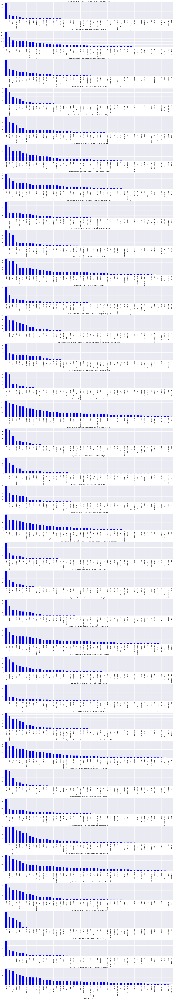

In [37]:
#Visualization of Subcategories across different cities
total_killed_df = df_IND[df_IND['Outcome of Incident']=='Persons Killed']
labels_subcat = total_killed_df['Cause Subcategory'].unique()


num_subcategories = len(labels_subcat)
fig, axes = plt.subplots(num_subcategories, 1, figsize=(30, num_subcategories * 5))
fig.subplots_adjust(hspace=0.7)

for i, label in enumerate(labels_subcat):
    labels_subcat_df = total_killed_df[total_killed_df['Cause Subcategory']==label]
    subcat_killed = labels_subcat_df.groupby('Million Plus Cities')['Count'].sum().sort_values(ascending=False)
    subcat_killed.plot(
        kind='bar',
        ax=axes[i] if num_subcategories > 1 else axes,
        color='blue'
    )
    axes[i].set_title(f"City-wise distribution of Total Persons killed due to {label}")